# ATSC 528 Homework 2: Successive Corrections  
Author: Brian T. Horan  
Created: 10/17/2022  
Assignment: ATSC 528 HW 2  
Purpose: To read in upper air observations and plot them on a polar stereographic projection using successive corrections. The data is read in using pandas. The grid is created with np.meshgrid, and the Lats/Lons from the observations are converted to x and y coordinates, in CM, to analyze using relative radius of influence. The dmin is calculated using the relative radius and found with numpy functions. The Cressman weight function is implemented in a function which calculates each obs weight for the roi.  
# FINISH THIS

In [2]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 #numpy for math
import matplotlib.pyplot as plt    #matplotlib for plotting
import cartopy.crs as ccrs         #cartopy for plotting on map
import cartopy.feature as cfeature #cartopy basic shapefiles
import pandas as pd                #Pandas for opening file

In [133]:
#Set some global variables for use
global x_o
global y_o
global del_x
global del_y

In [111]:
#Define a function to find the dmin
def calc_dmin(x_obs, y_obs):
    min_rois = np.empty((len(x_obs)))
    for i in range(len(x_obs)):
        rel_x = x_obs[i] - x_obs
        rel_y = y_obs[i] - y_obs
        rel_rad = (rel_x **2 + rel_y **2)**0.5
        rel_rad = np.delete(rel_rad, i)
        min_rois[i] = np.amin(rel_rad)
    return np.mean(min_rois)

In [708]:
### Create function for Cressman Analysis ###
#Function only finds the analysis point one at a time
def cressman(n_roi, roi, xs, ys, fo, anal_back=None, back_o = None):
    
    #Variables passed in
    #n_roi = Roi Number
    #roi = The ROI
    #xs = x points of observations in roi
    #ys = y points of observations in roi
    #fo = Observations
    #anal_back = analysis background
    #back_o = observation background
    
    if n_roi == 0 or anal_back == None:
        wgts = np.empty((len(xs)))
        for i in range(len(xs)):
            rad1 = (xs[i]**2 + ys[i]**2) **0.5
            wgt = (roi**2 - rad1**2)/(roi**2 + rad1**2)
            wgts[i] = wgt
        
        cressanal = np.nansum(wgts*fo)/np.sum(wgts) 
        return cressanal
    else:
        wgts = np.empty(len(xs))
        for i in range(len(xs)):
            rad1 = (xs[i]**2 + ys[i]**2) **0.5
            wgt = (roi**2 - rad1**2)/(roi**2 + rad1**2)
            wgts[i] = wgt
        
        cressanal = anal_back + (np.nansum(wgts*(fo-back_o))/np.sum(wgts))
        return cressanal

In [693]:

### Create function for bilinear interpolation ###
def bilinear_interp(xob, yob, a, n_roi):
    
    #Variables passed in
    # A = Analysis observations
    # x_ob = location of x for ob
    # y_ob = location of y for ob
    #n_roi = number of roi
    
    xind = (xob - x_o) / del_x
    yind = (yob - y_o) / del_y    
    sq_mat = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    di = xind - np.floor(xind)
    dj = yind - np.floor(yind)
    xind = int(np.floor(xind))
    yind = int(np.floor(yind))
    a_mat = np.matrix([1, di, dj, di*dj]).T
    fmat = np.matrix([a[yind, xind, n_roi],
            a[yind,xind+1,n_roi],
            a[yind+1, xind,n_roi],
             a[yind+1, xind+1,n_roi]])
    
    
    
    return fmat * sq_mat * a_mat

In [779]:
#define a method to find the background obs using either Bilinear interpolation, Cressman analysis, or setting it to NaN if not in the ROI
def find_background_obs(roi, n_roi):
    #Variables passed in
    #roi = radius of influence
    #n_roi = number of the roi/iteration number
    
    for i in range(len(hgts_500)):
        if x_observed[i] > np.amin(xs) and \
            x_observed[i] < np.amax(xs) and \
            y_observed[i] > np.amin(ys) and \
            y_observed[i] < np.amax(ys):
                #print('In radius ' + str(i))
                background_obs[i, n_roi-1] = bilinear_interp(x_observed[i], y_observed[i], analysis_arr, n_roi-1)
        else: 
            rad = ((x_observed[i]-xs) ** 2 + (y_observed[i]-ys)**2)**0.5
            inds_roia = np.where(rad <= roi)
            
            if np.amin(rad) > roi:
                background_obs[i, n_roi-1] = np.nan
            else:
                rel_xb = (x_observed[i] - xs[inds_roia]).flatten()
                rel_yb = (y_observed[i] - ys[inds_roia]).flatten()
                heights = (analysis_arr[:,:,0][inds_roia]).flatten()
                background_obs[i, n_roi-1] = cressman(n_roi, roi, rel_xb, rel_yb, heights)
    return background_obs

In [780]:
### Read in observations ###
ds = pd.read_csv('./RAOBs_201903131200.txt', names = ['Station', 'Lat', 'Lon', 'Height', 'Wind_dir', 'Wind_spd'])
lons = ds['Lon']
lats = ds['Lat']
hgts_500 = ds['Height']

In [781]:
### Set up analysis map with a 22x28 rectangular grid of points ###
#The analysis grid is the same as the one for homework 1, so I will recycle this code here.
x_o = 18.90
y_o = -6.3
del_x = 1.27
del_y = 1.27
x_n = 22
y_n = 28


x_grid = np.arange(start = x_o, stop = (x_o+x_n*del_x) - 1, step=del_x)
y_grid = np.arange(start = y_o, stop = (y_o+y_n*del_y) - 1, step=del_y)
xs, ys = np.meshgrid(x_grid, y_grid)

In [782]:
### convert obs lat/long to x,y ###
rho = 6371 * 1e5
psi_0 = 60 * (np.pi/180)
map_proj = 1/(15e6)
lambda_not = -115

LATS_grid = (180/np.pi) * ((np.pi/2) - (2*np.arctan((np.sqrt((xs/map_proj)**2 + (ys/map_proj)**2))/(rho*(1+np.sin(psi_0)))))) 
LONS_grid = np.arctan(ys/xs) * (180/np.pi) + lambda_not

In [783]:
sigma = (1+np.sin(psi_0))/(1+np.sin((lats*(np.pi/180))))
r = rho * sigma * np.cos(lats*((np.pi/180))) * map_proj
y_observed = r*np.sin((lons*(np.pi/180))-lambda_not * (np.pi/180))
x_observed = r*np.cos(((lons*(np.pi/180)) - (lambda_not*(np.pi/180))))

In [784]:
#Use radii of influence 4, 2.5, 1.5 *dmin
dmin = calc_dmin(x_observed.values, y_observed.values)
rois = np.array([4, 2.5, 1.5]) * dmin

In [785]:
#declare empty arrays for storage of values
analysis_arr = np.empty((y_n, x_n, len(rois)))
n_obs_arr = np.empty((y_n, x_n, len(rois)))
background_obs = np.empty((len(hgts_500), len(rois)))


In [786]:
### First analysis, no successive corrections ###
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[0])[0]
        n_obs_arr[i, j, 0] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
            
        analysis_arr[i, j, 0] = cressman(0, rois[0], x_k, y_k, fo)

In [787]:
### Calculate background 1 and successive correction pass 1
b_obs = find_background_obs(rois[0], 0)
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[1])[0]
        n_obs_arr[i, j, 1] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
        
        back_a = analysis_arr[i,j,0]
        back_o = background_obs[ind_rois, 0]
        analysis_arr[i, j, 1] = cressman(1, rois[1], x_k, y_k, fo, anal_back = back_a, back_o = back_o)

In [788]:
#calculate background pass 2 and correction pass 2
b_obs = find_background_obs(rois[1], 1)
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[2])[0]
        n_obs_arr[i, j, 2] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
        
        back_a = analysis_arr[i,j,1]
        back_o = background_obs[ind_rois, 1]
        analysis_arr[i, j, 2] = cressman(2, rois[2], x_k, y_k, fo, anal_back = back_a, back_o = back_o)

/tmp/ipykernel_44823/3710781111.py:29: RuntimeWarning: invalid value encountered in double_scalars
  cressanal = anal_back + (np.nansum(wgts*(fo-back_o))/np.sum(wgts))


In [789]:
#Calculate differences in analysis fields
diff_21 = analysis_arr[:,:,1] - analysis_arr[:,:,0]
diff_31 = analysis_arr[:,:,2] - analysis_arr[:,:,0]
diff_32 = analysis_arr[:,:,2] - analysis_arr[:,:,1]

In [792]:
#calculate background 3 and RMS values
b_obs = find_background_obs(rois[2], 2)
background_obs[:,0]
bobs = 

array([5477.84602159, 5545.5091093 , 5379.05803535, 5386.02305598,
       5271.803172  , 5256.67495992,           nan, 5300.93946996,
       5291.99098288, 5495.66428878,           nan, 5497.43991133,
       5344.94871043, 5409.20214547,           nan, 5508.57027816,
       5297.46135373,           nan, 5368.81399443, 5304.63799077,
       5341.79004778, 5293.03275713, 5452.32444602, 5406.52364713,
       5490.46501694, 5385.49400699, 5513.19356226, 5543.54277618,
                 nan, 5697.85794956,           nan, 5512.59209697,
       5639.80221819, 5587.94445798, 5299.47830463, 5367.29276431,
       5640.98922483, 5734.2055258 ,           nan, 5507.22100679,
       5778.32361205, 5745.09624698, 5448.12998143, 5731.28325723,
                 nan, 5664.19987556, 5731.6559745 , 5534.08550454,
                 nan, 5626.11301309, 5790.51266922, 5716.09623193,
       5578.16325913, 5518.36243534, 5669.61863357, 5522.73252534,
       5519.69218061, 5668.49483294, 5673.1981469 , 5654.04569

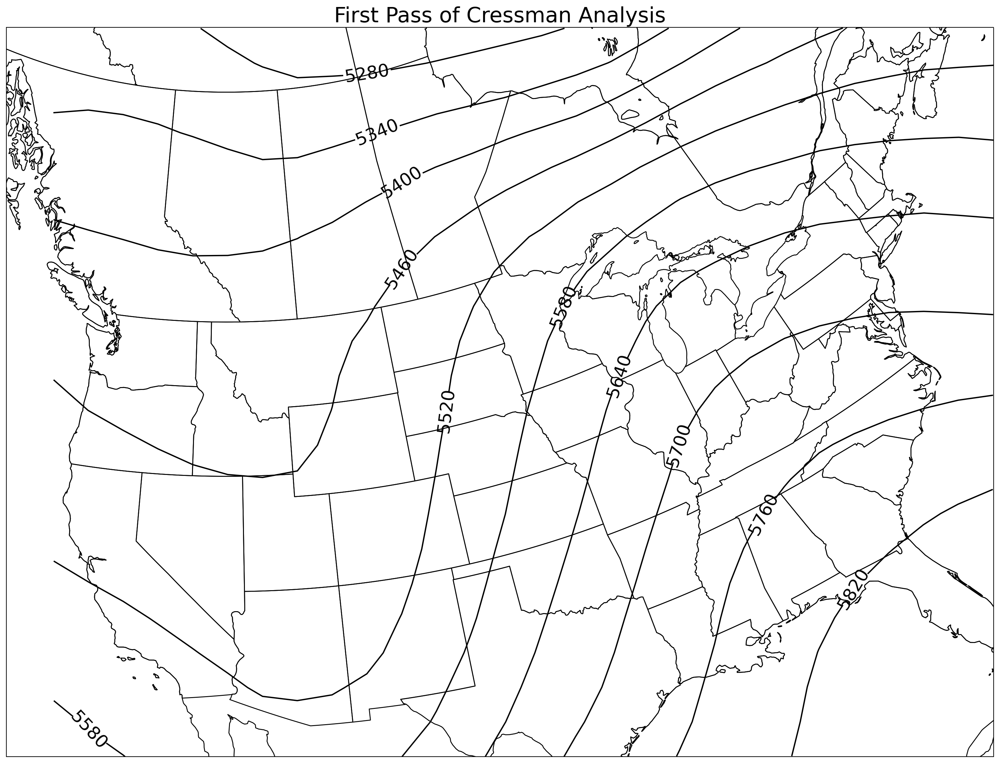

In [704]:
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,0], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('First Pass of Cressman Analysis')
plt.show()


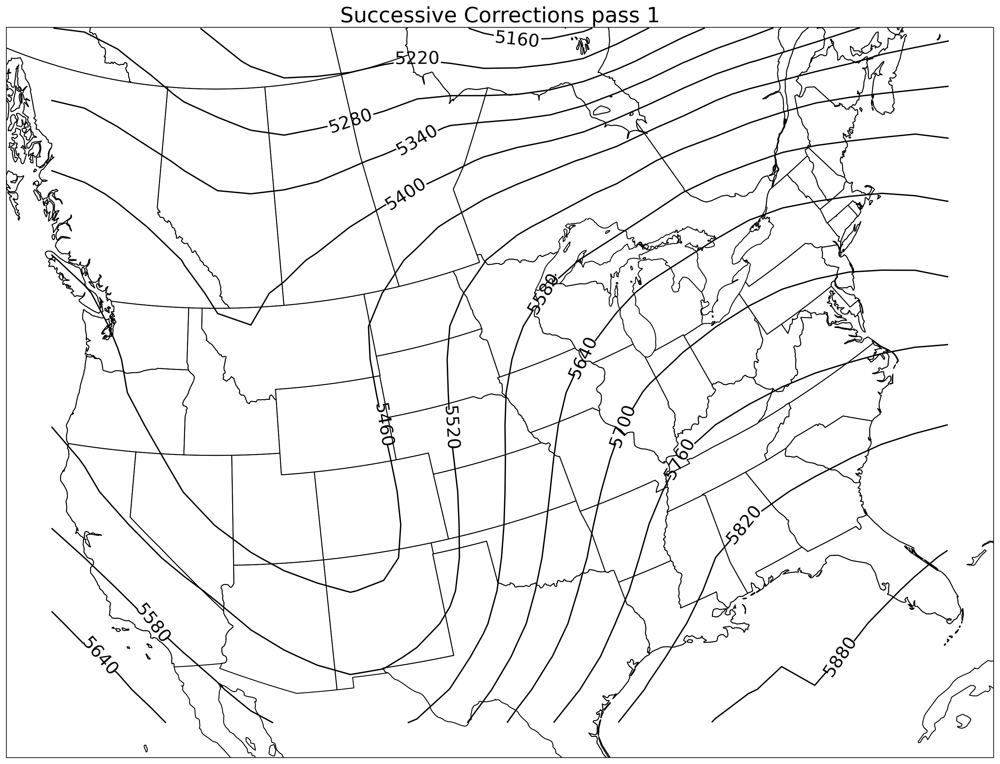

In [705]:
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,1], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Successive Corrections pass 1')
plt.show()


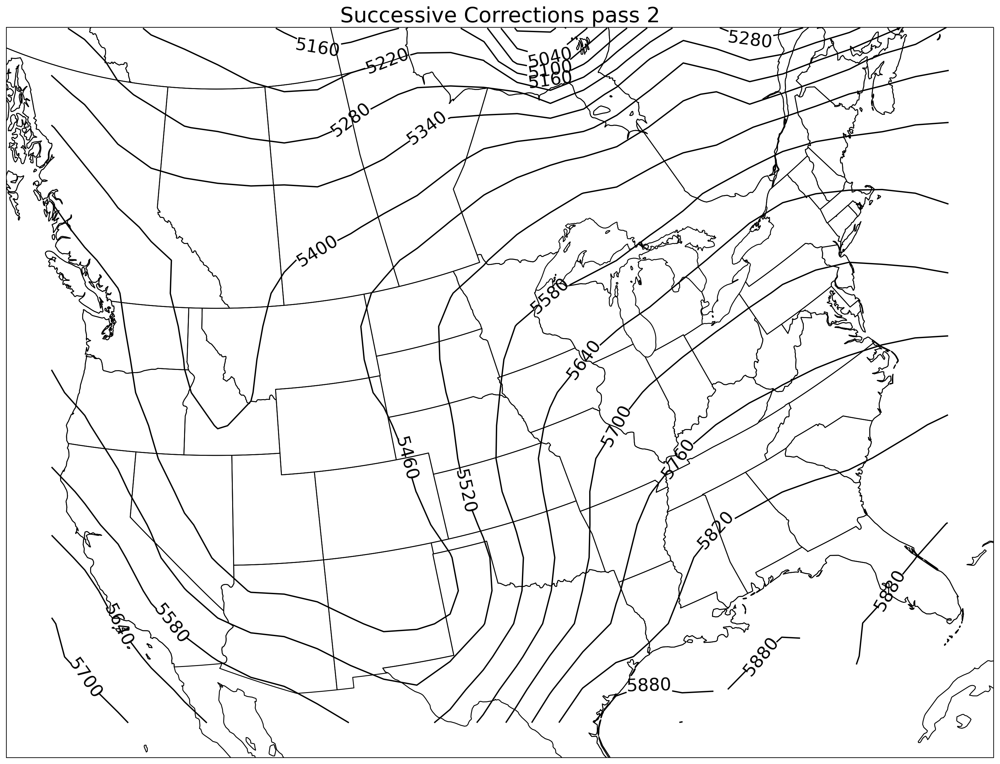

In [710]:
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,2], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Successive Corrections pass 2')
plt.show()

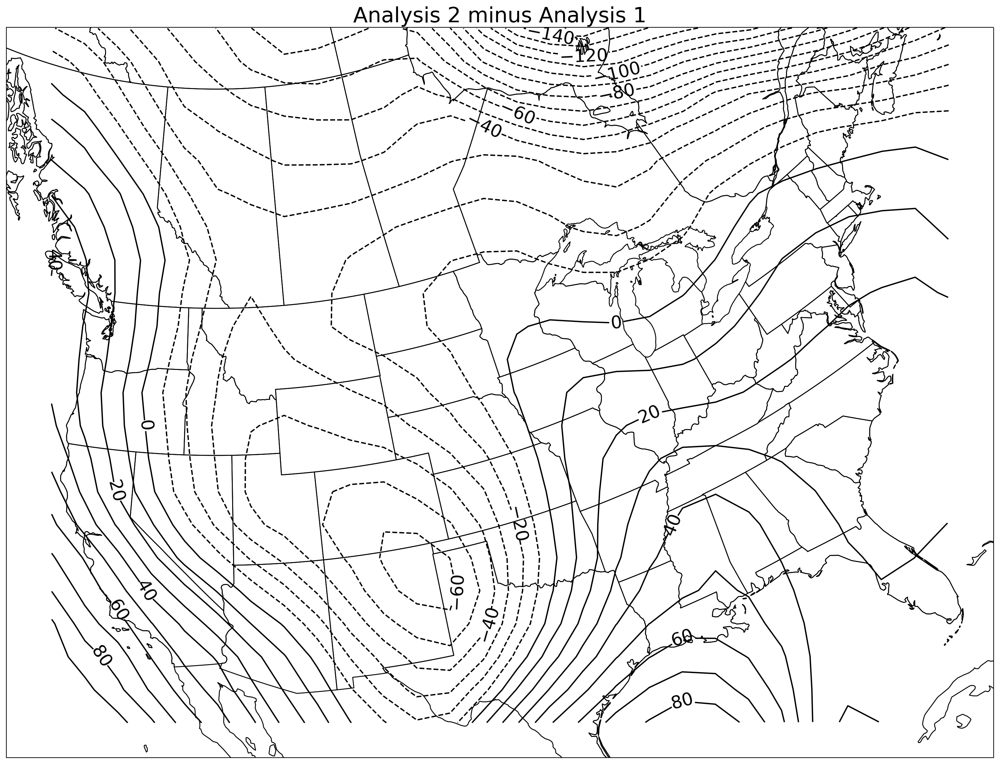

In [747]:
### Plot Analysis Differences ###
fig = plt.figure(figsize = (20,20),dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, diff_21, colors = 'k', levels = np.arange(-160,160,10), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-160,160,20))
plt.title('Analysis 2 minus Analysis 1')
plt.show()

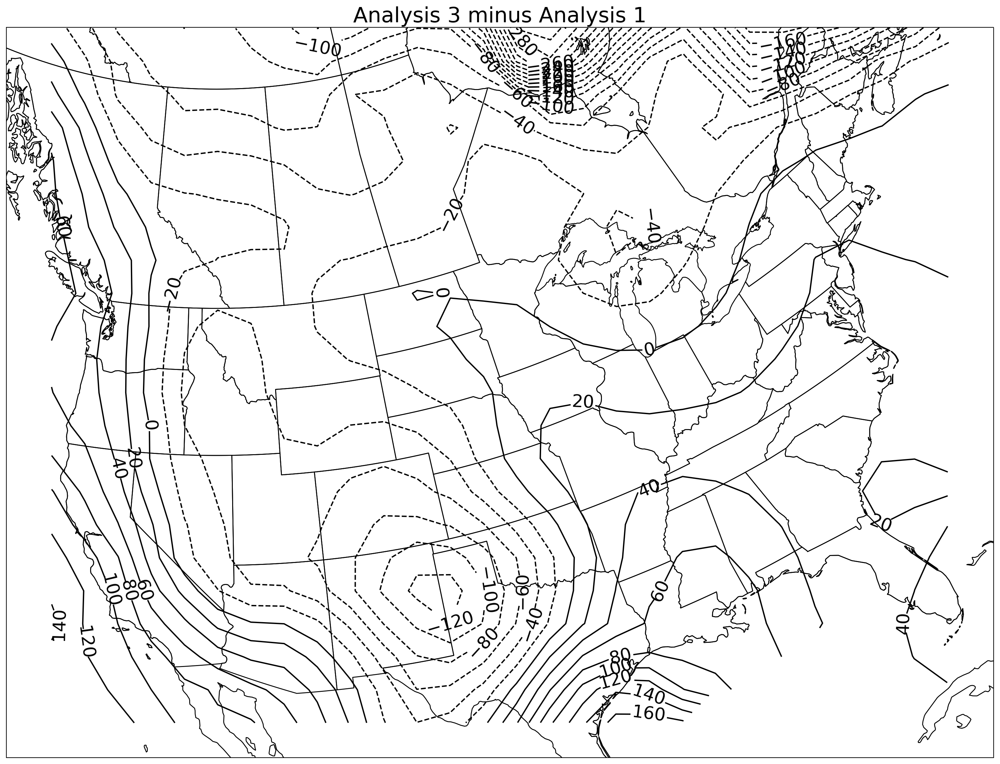

In [750]:
### Plot Analysis Differences ###
fig = plt.figure(figsize = (20,20),dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, diff_31, colors = 'k', levels = np.arange(-300,300,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-300,300,20))
plt.title('Analysis 3 minus Analysis 1')
plt.show()

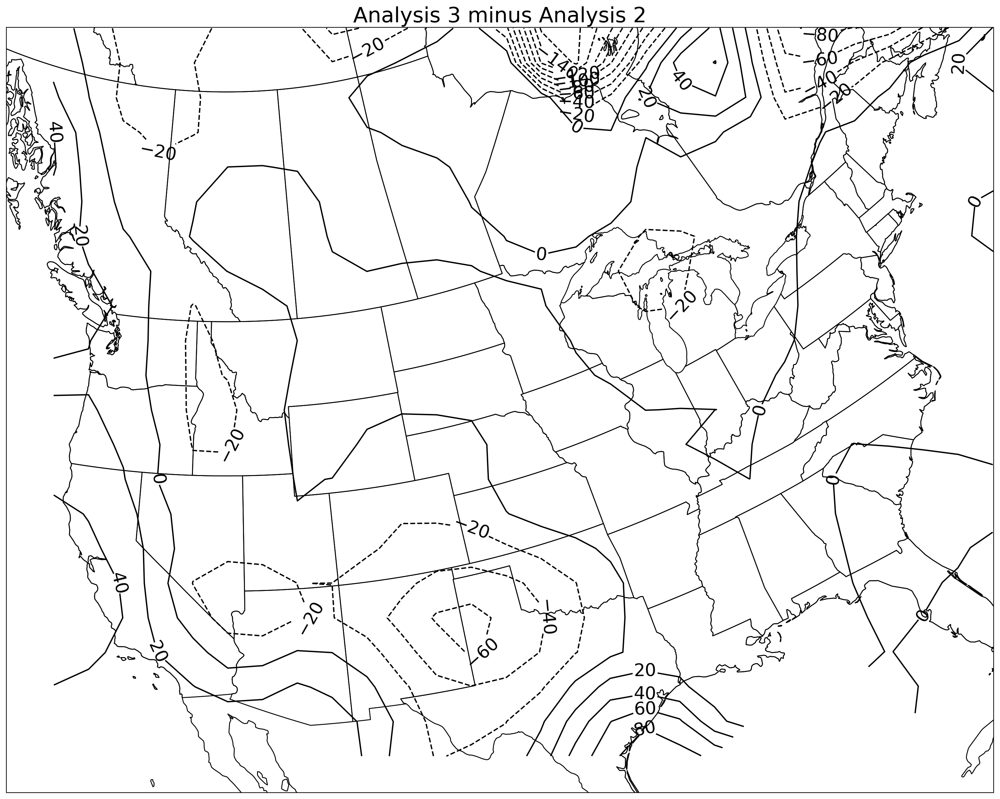

In [751]:
### Plot Analysis Differences ###
fig = plt.figure(figsize = (20,20),dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, diff_32, colors = 'k', levels = np.arange(-300,300,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-300,300,20))
plt.title('Analysis 3 minus Analysis 2')
plt.show()

In [ ]:
### Store the analyses in text files ###
with open() as f:
    

In [ ]:
### Store the difference fields in text files ###
with open() as f1:

In [ ]:
### Store RMS values in text file ###
with open() as f2:

In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.
    In the first pass, there is a trough present but not very deep. There is a deeper trough in both passes 2 and 3. In pass 3, there appears to be an upper level low on the 
    upper fringe of our analysis grid.

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    Passes 2 and 3 seem to be smoother in the area of interest but there are differences introduced in the boundary areas.

3 - What happens as you increase the number of successive correction passes?  Is this 
    desirable?  Why or why not?
    We get better looking features as we continue successive corrections, and resolve well the large scale features. However, in the difference fields,
    we see that boundaries are not handled well due to the cressman weighting. Also, we see that the successive corrections resolve better the trough over the CONUS
    

'''